In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
import cv2
import numpy as np
import glob

# Definir dimensiones del tablero (esquinas internas)
chessboard_size = (9, 6)

# Criterio de terminación de subpixeles
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Preparar puntos 3D (0,0,0 ... 8,5,0)
objp = np.zeros((np.prod(chessboard_size), 3), np.float32)
objp[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)

objpoints = [] # Puntos 3D
imgpoints = [] # Puntos 2D

# Cargar imágenes del tablero (se realizó desde colab, por eso tiene dirección a drive)
images = glob.glob('/content/drive/MyDrive/2. ING. SISTEMAS/4to semestre/Visión computacional/Fotos/*.jpg')

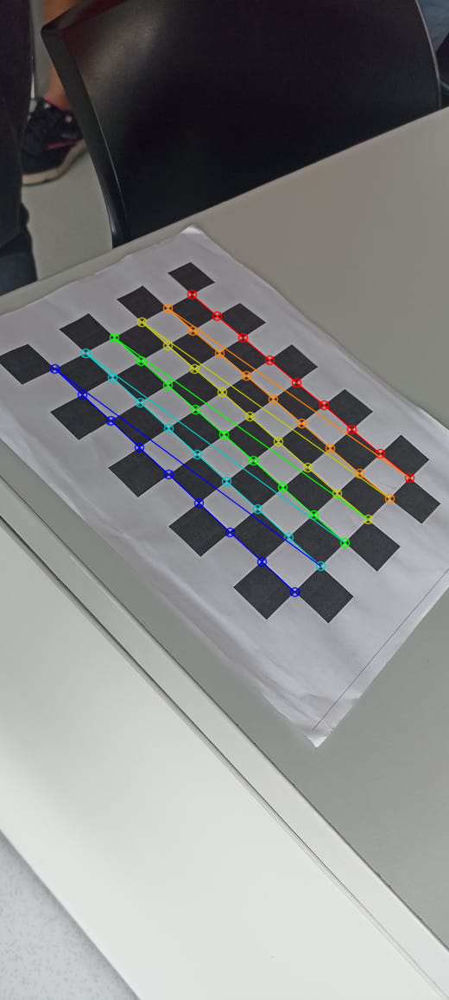

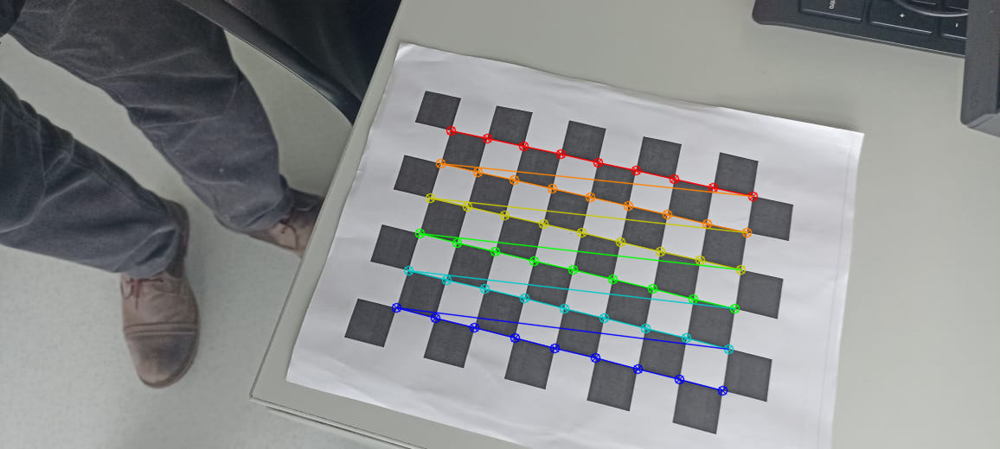

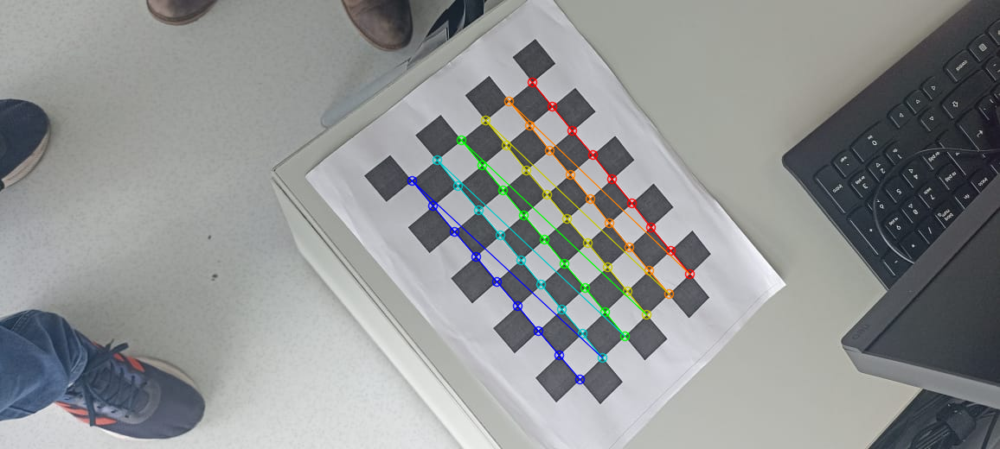

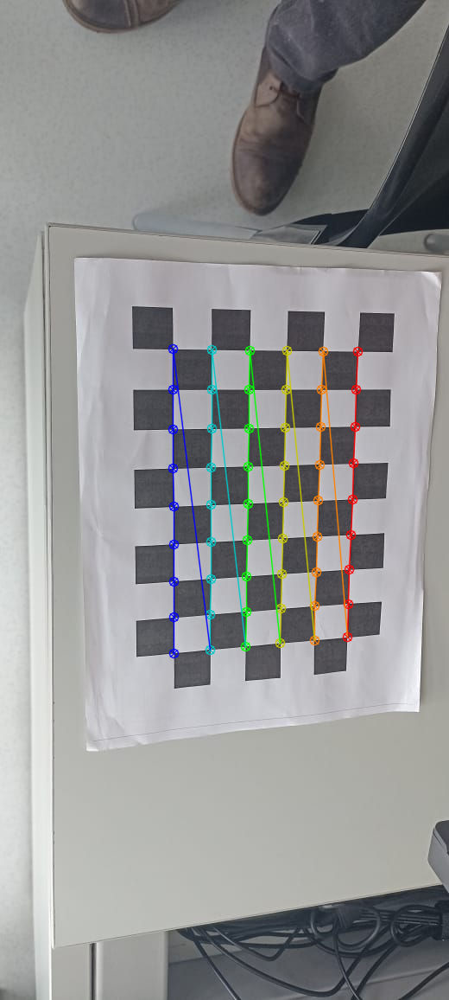

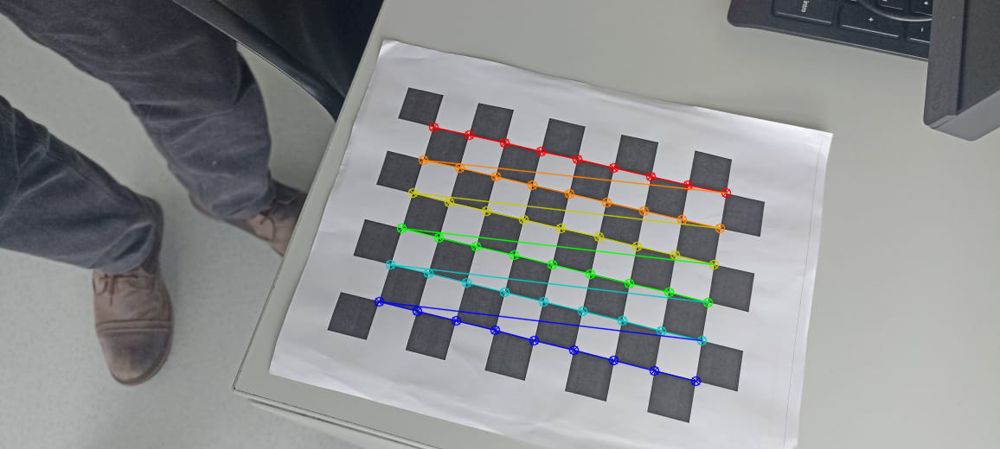

...

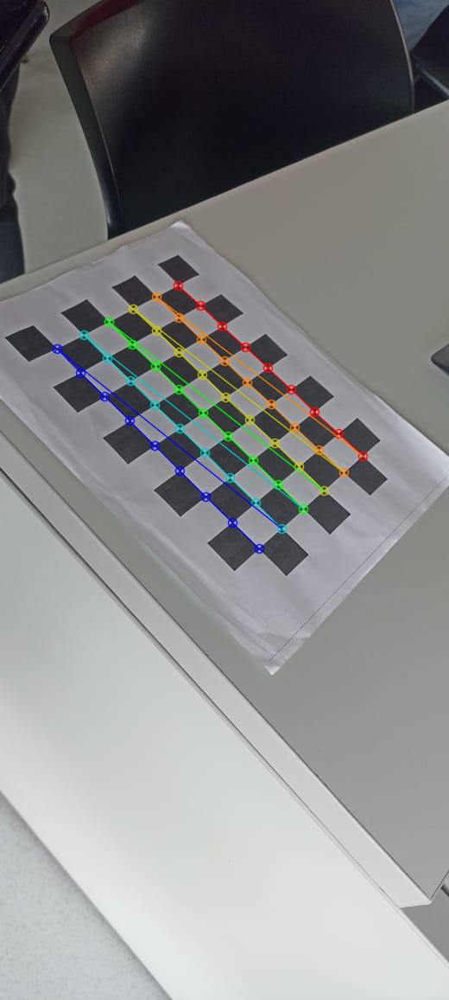

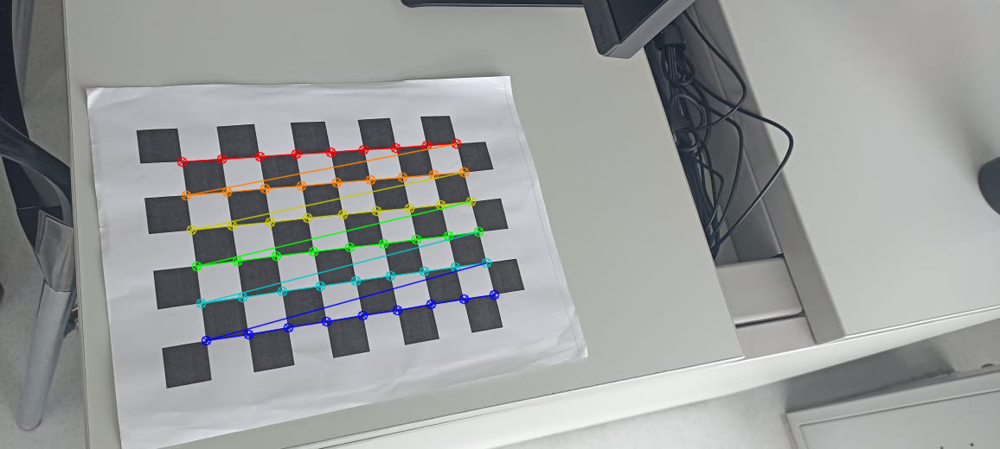

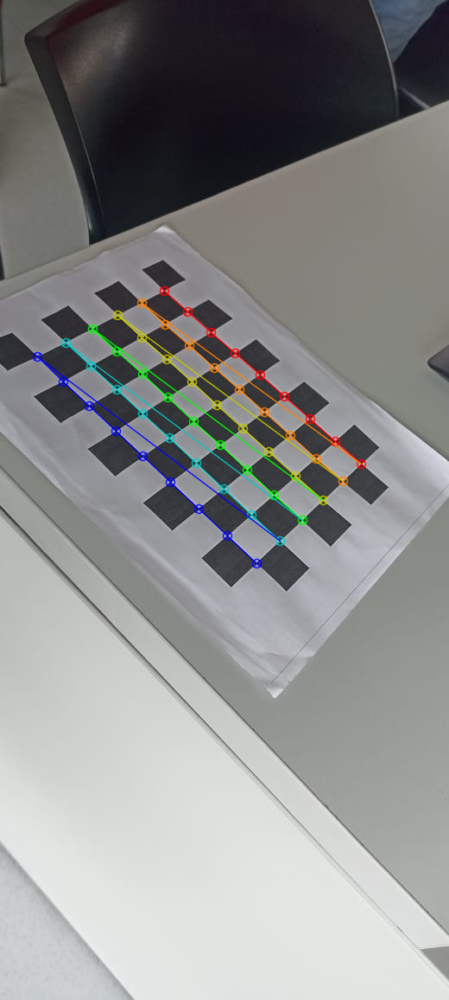

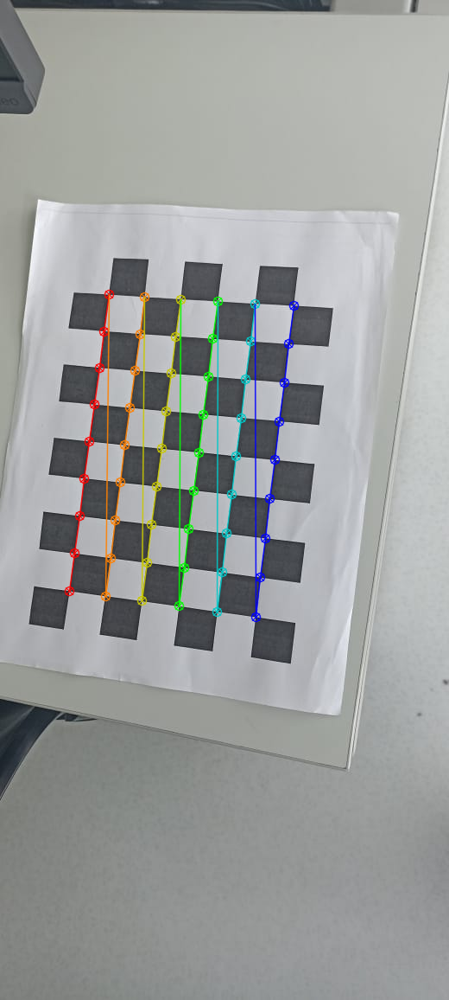

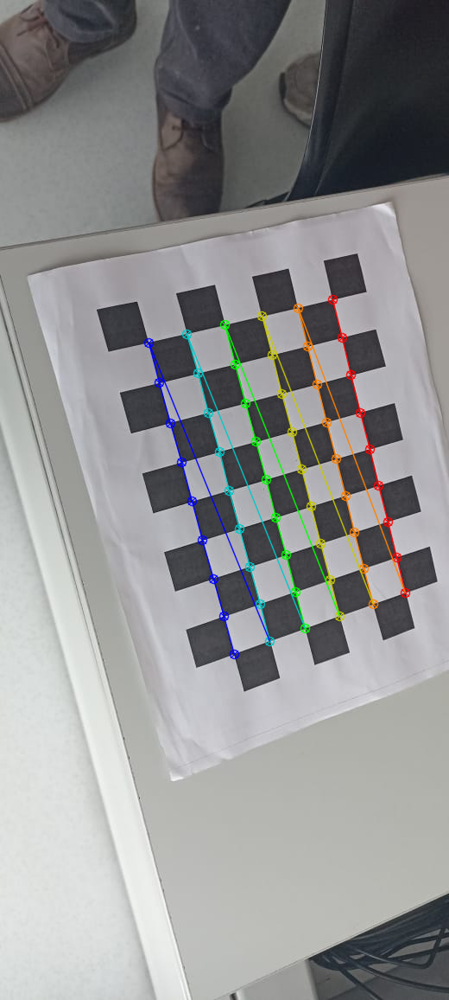

In [30]:
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ret, corners = cv2.findChessboardCorners(gray, chessboard_size, None)
    if ret:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        imgpoints.append(corners2)
        # mostrar los bordes
        img = cv2.drawChessboardCorners(img, chessboard_size, corners2, ret)
        cv2_imshow(img)

# Calibración
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


In [31]:
print("Matriz de la cámara:\n", mtx)
print("Coeficientes de distorsión:\n", dist)

Matriz de la cámara:
 [[938.90697839   0.         381.40651053]
 [  0.         981.36366806 380.70740535]
 [  0.           0.           1.        ]]
Coeficientes de distorsión:
 [[-0.29350085  0.59280539 -0.02970905 -0.01397181 -0.64797308]]


In [34]:
# Cargar la imagen original (distorsionada)
img = cv2.imread(images[0])
h, w = img.shape[:2]

# Guardar la imagen distorsionada
cv2.imwrite('/content/drive/MyDrive/2. ING. SISTEMAS/4to semestre/Visión computacional/original_distorted.jpg', img)

# Obtener nueva matriz de cámara optimizada
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

# Corregir la distorsión
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

# Guardar la imagen corregida
cv2.imwrite('/content/drive/MyDrive/2. ING. SISTEMAS/4to semestre/Visión computacional/calibrated_result.jpg', dst)

True

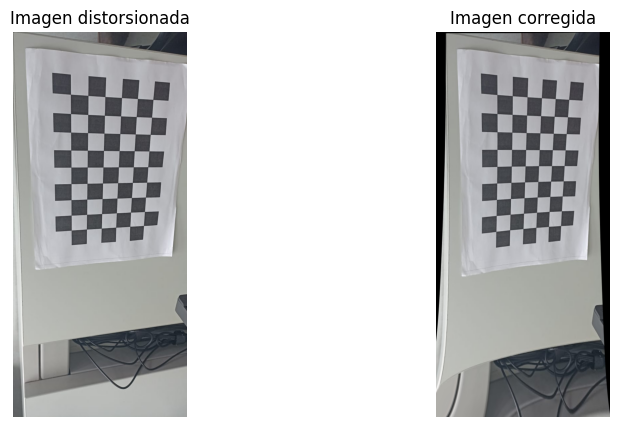

In [47]:
import matplotlib.pyplot as plt

# Cargar la imagen original (distorsionada)
img = cv2.imread(images[10])
h, w = img.shape[:2]

# Obtener nueva matriz de cámara optimizada
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

# Corregir la distorsión
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

# Mostrar ambas imágenes
plt.figure(figsize=(10,5))

# Imagen original
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Imagen distorsionada")
plt.axis("off")

# Imagen corregida
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
plt.title("Imagen corregida")
plt.axis("off")

plt.show()
